In [1]:
from pycigar.utils.input_parser import input_parser

In [2]:
misc_inputs = '/home/toanngo/Documents/GitHub/cigar-document/ceds-cigar/pycigar/data/ieee240busdata/misc_inputs.csv'
dss = '/home/toanngo/Documents/GitHub/cigar-document/ceds-cigar/pycigar/data/ieee240busdata/Master.dss'
load_solar = '/home/toanngo/Documents/GitHub/cigar-document/ceds-cigar/pycigar/data/ieee240busdata/load_solar_data.csv'
breakpoints = '/home/toanngo/Documents/GitHub/cigar-document/ceds-cigar/pycigar/data/ieee240busdata/breakpoints.csv'

start = 100
sim_params = input_parser(misc_inputs, dss, load_solar, breakpoints, benchmark=True, vectorized_mode=True, percentage_hack=0.45)
sim_params['scenario_config']['start_end_time'] = [start, start + 750]
del sim_params['attack_randomization']

In [3]:
from pycigar.envs import CentralControlPVInverterEnv

env = CentralControlPVInverterEnv(sim_params=sim_params)

In [4]:
env.reset()
done = False
while not done:
    _, _, done, _ = env.step(10)


In [5]:
from pycigar.utils.logging import logger
Logger = logger()

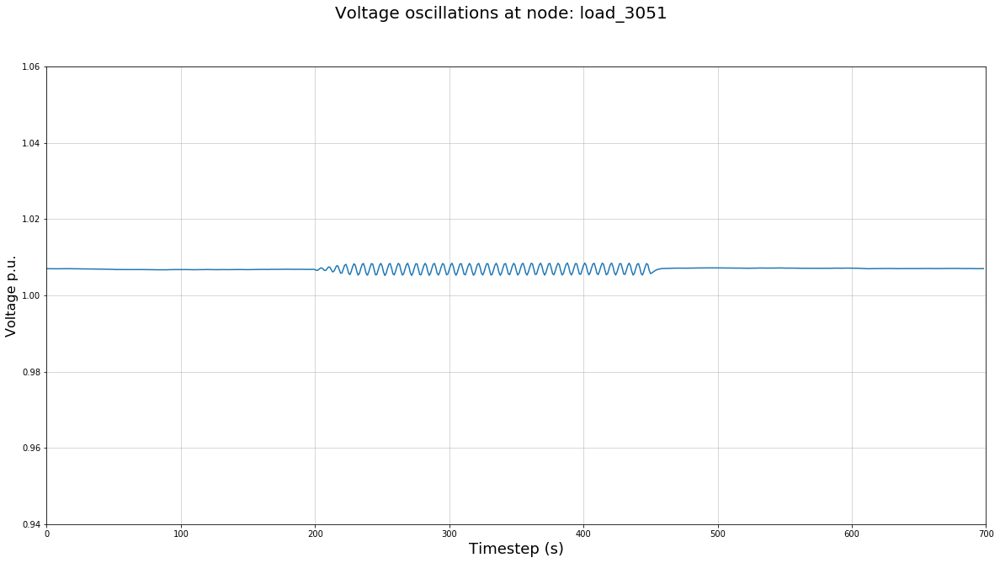

In [7]:
import matplotlib.pyplot as plt 
f, ax = plt.subplots(figsize=(20, 10))

ax.grid(linestyle='-', linewidth=0.5)
ax.set_xlim([0, 700])
ax.set_ylim([0.94, 1.06])
node_id = 'load_3051'
f.suptitle('Voltage oscillations at node: {}'.format(node_id), fontsize=20)
plt.xlabel('Timestep (s)', fontsize=18)
plt.ylabel('Voltage p.u.', fontsize=16)
ax.plot(Logger.log_dict['load_3051']['voltage'])
plt.show()

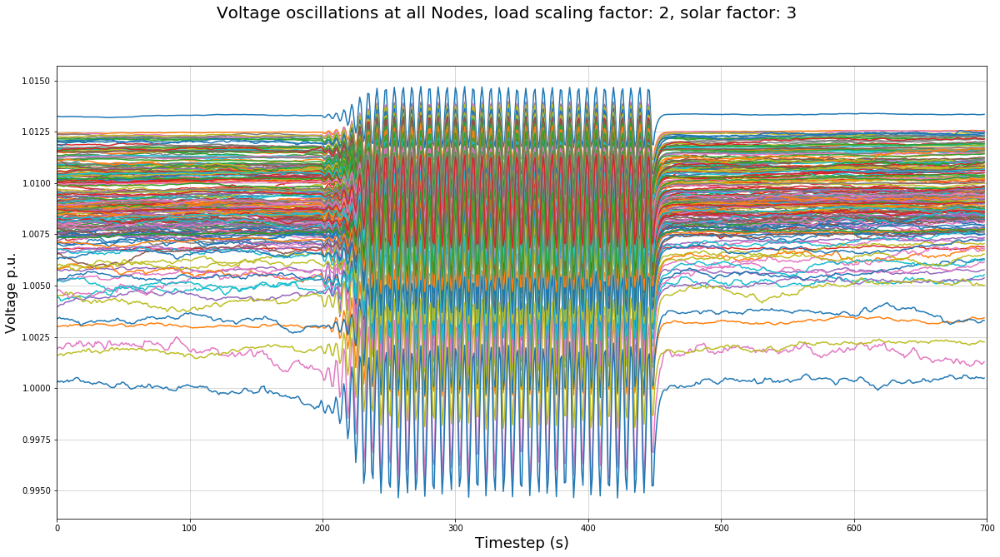

In [6]:
import matplotlib.pyplot as plt

f, ax = plt.subplots(figsize=(20, 10))

f.suptitle('Voltage oscillations at all Nodes, load scaling factor: {}, solar factor: {}'.format(2, 2), fontsize=20)
plt.xlabel('Timestep (s)', fontsize=18)
plt.ylabel('Voltage p.u.', fontsize=16)
ax.set_xlim([0, 700])
#ax.set_ylim([0, 5])

ax.grid(linestyle='-', linewidth=0.5)

for load_id in Logger.log_dict.keys():
    if 'load_' in load_id and 'inverter_' not in load_id:
    #print(load_id)
        ax.plot(Logger.log_dict[load_id]['voltage'])
plt.show()

In [7]:
env.k.kernel_api.get_node_voltage('load_3051')

0.9862355496394238

In [8]:
import opendssdirect as dss 

dss.Loads.Name('load_3051')
voltage = dss.CktElement.VoltagesMagAng()

In [9]:
voltage

[117.920383746682,
 -30.400932240429213,
 118.844040464179,
 -150.47584134820542,
 118.54327247200769,
 89.64409599257552,
 0.0,
 0.0]

In [10]:
(voltage[0] + voltage[2] + voltage[4]) / (dss.CktElement.NumPhases() * (dss.Loads.kV() * 1000 / (3**0.5)))

0.9862355496394238

In [8]:
import numpy as np
def get_translation_and_slope(a_val):
    points = np.array(a_val)
    slope = points[:, 1] - points[:, 0]
    og_point = points[0, 2]
    translation = points[:, 2]
    return translation, slope

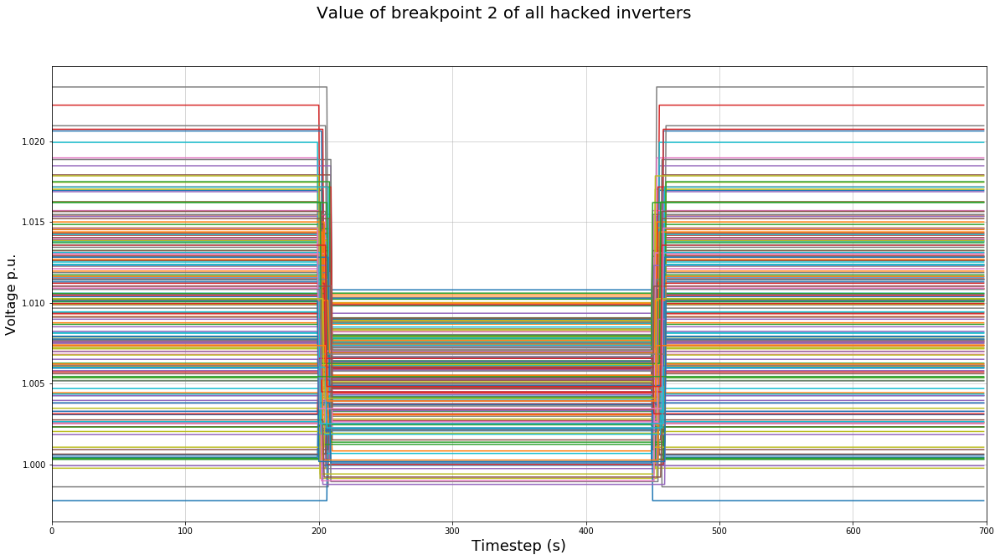

In [9]:
import matplotlib.pyplot as plt 
f, ax = plt.subplots(figsize=(20, 10))

ax.grid(linestyle='-', linewidth=0.5)
ax.set_xlim([0, 700])
f.suptitle('Value of breakpoint 2 of all hacked inverters'.format(node_id), fontsize=20)
plt.xlabel('Timestep (s)', fontsize=18)
plt.ylabel('Voltage p.u.', fontsize=16)

for idv in Logger.log_dict.keys():
    if 'adversary_' in idv:
        translation, slope = get_translation_and_slope(Logger.log_dict[idv]['control_setting'])
        ax.plot(translation)
plt.show()

In [11]:
Logger.log_dict['adversary_inverter_load_3051']['p_out']

dict_keys(['y', 'u', 'p_set', 'q_set', 'p_out', 'q_out', 'control_setting', 'sbar_solarirr', 'sbar_pset', 'solar_irr', 'node'])


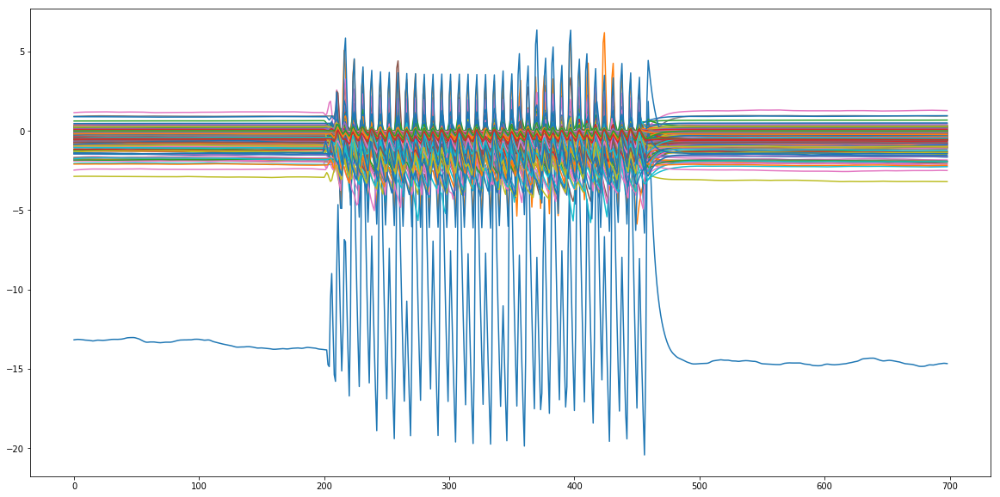

In [10]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 10))
for idv in Logger.log_dict.keys():
    if 'adversary_' in idv:
        translation = Logger.log_dict[idv]['q_out']
        plt.plot(translation)
plt.show()

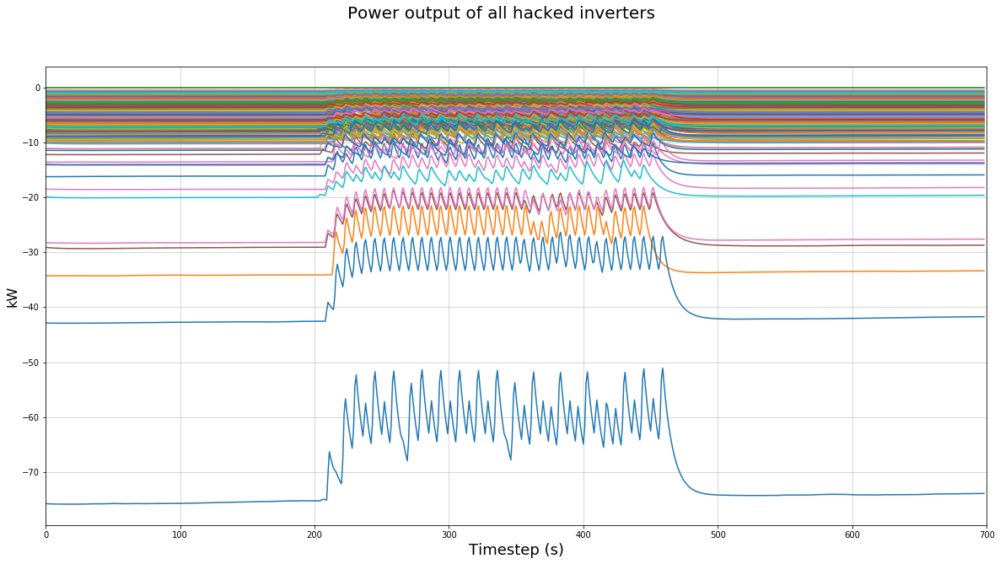

In [11]:
import matplotlib.pyplot as plt 
f, ax = plt.subplots(figsize=(20, 10))

ax.grid(linestyle='-', linewidth=0.5)
ax.set_xlim([0, 700])
f.suptitle('Power output of all hacked inverters'.format(node_id), fontsize=20)
plt.xlabel('Timestep (s)', fontsize=18)
plt.ylabel('kW', fontsize=16)

for idv in Logger.log_dict.keys():
    if 'adversary_' in idv:
        translation = Logger.log_dict[idv]['p_out']
        ax.plot(translation)
plt.show()

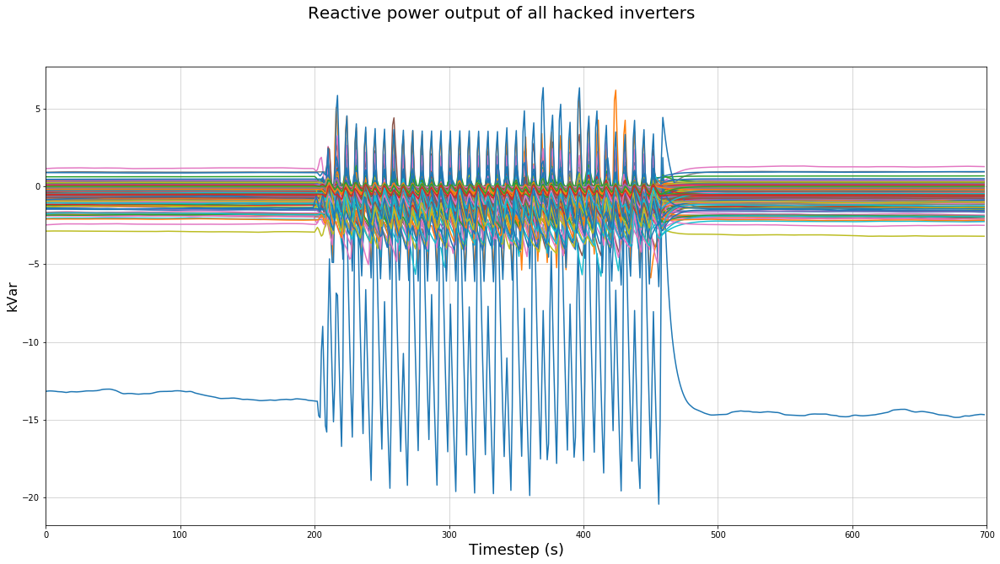

In [12]:
import matplotlib.pyplot as plt 
f, ax = plt.subplots(figsize=(20, 10))

ax.grid(linestyle='-', linewidth=0.5)
ax.set_xlim([0, 700])
f.suptitle('Reactive power output of all hacked inverters'.format(node_id), fontsize=20)
plt.xlabel('Timestep (s)', fontsize=18)
plt.ylabel('kVar', fontsize=16)

for idv in Logger.log_dict.keys():
    if 'adversary_' in idv:
        translation = Logger.log_dict[idv]['q_out']
        ax.plot(translation)
plt.show()

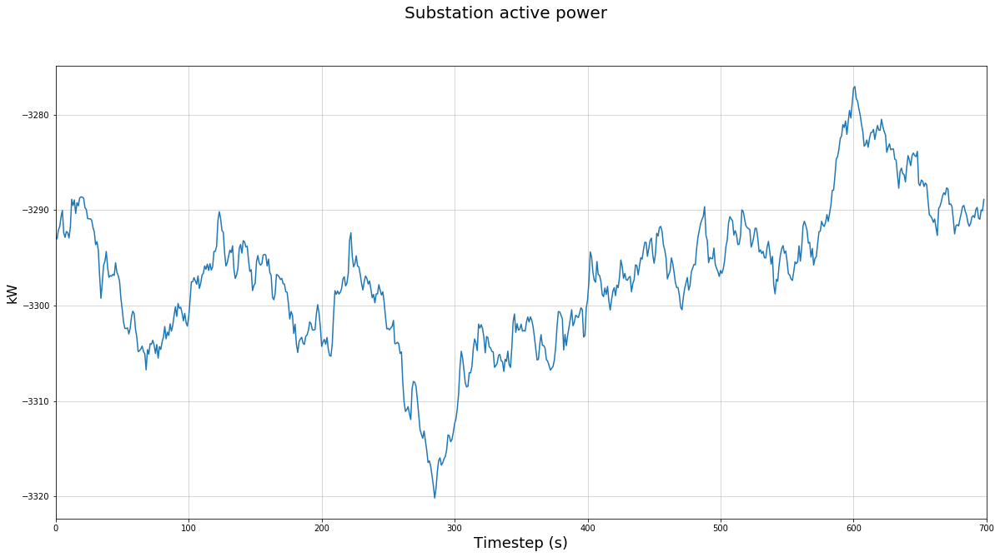

In [6]:
import numpy as np

import matplotlib.pyplot as plt 
f, ax = plt.subplots(figsize=(20, 10))

ax.grid(linestyle='-', linewidth=0.5)
ax.set_xlim([0, 700])
f.suptitle('Substation active power', fontsize=20)
plt.xlabel('Timestep (s)', fontsize=18)
plt.ylabel('kW', fontsize=16)
ax.plot(np.array(Logger.log_dict['network']['substation_power'])[:, 0])
plt.show()

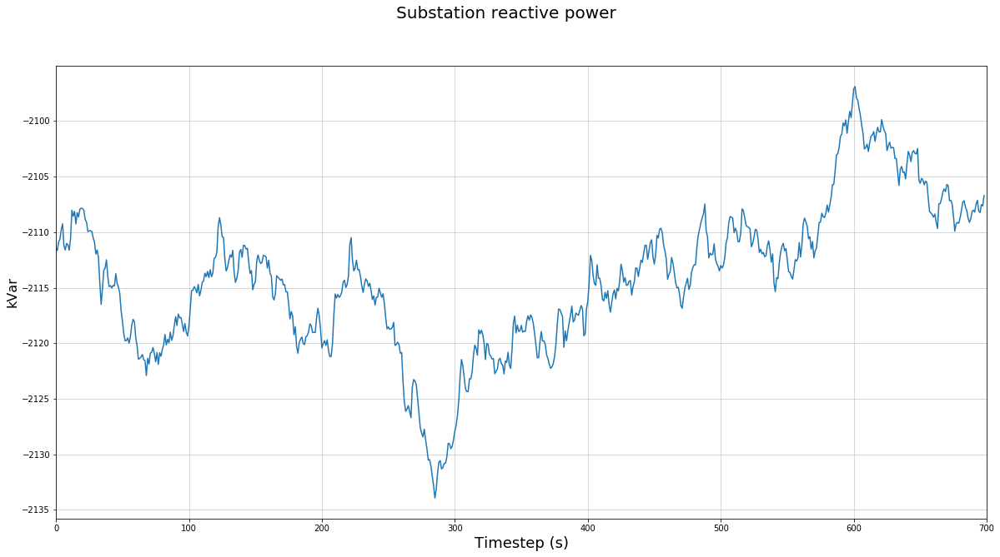

In [7]:
import numpy as np

import matplotlib.pyplot as plt 
f, ax = plt.subplots(figsize=(20, 10))

ax.grid(linestyle='-', linewidth=0.5)
ax.set_xlim([0, 700])
f.suptitle('Substation reactive power', fontsize=20)
plt.xlabel('Timestep (s)', fontsize=18)
plt.ylabel('kVar', fontsize=16)
ax.plot(np.array(Logger.log_dict['network']['substation_power'])[:, 1])
plt.show()

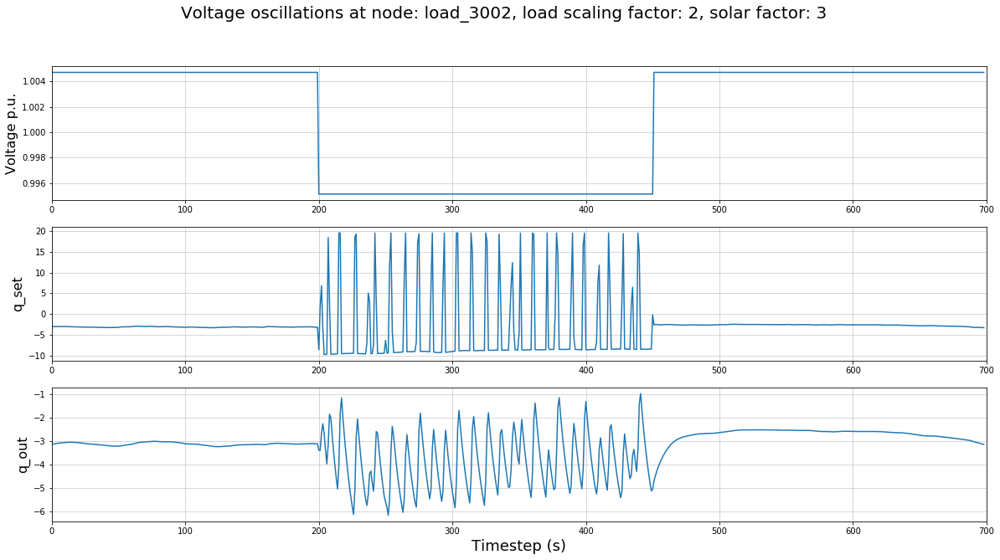

In [39]:
import numpy as np
def get_translation_and_slope(a_val):
    points = np.array(a_val)
    slope = points[:, 1] - points[:, 0]
    og_point = points[0, 2]
    translation = points[:, 2]
    return translation, slope

import matplotlib.pyplot as plt 
f, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 10))



for node_id in Logger.log_dict.keys():
    if 'load_' in node_id and 'inverter_' not in node_id:
        ax[0].grid(linestyle='-', linewidth=0.5)
        ax[0].set_xlim([0, 700])
        f.suptitle('Voltage oscillations at node: {}, load scaling factor: {}, solar factor: {}'.format(node_id, 2, 3), fontsize=20)
        #f.suptitle('Voltage oscillations at all nodes, load scaling factor: {}, solar factor: {}'.format(2, 3), fontsize=20)
        
        plt.xlabel('Timestep (s)', fontsize=18)
        ax[0].set_ylabel('Voltage p.u.', fontsize=16)
        translation, slope = get_translation_and_slope(Logger.log_dict['adversary_inverter_' + node_id]['control_setting'])
        ax[0].plot(translation)

        ax[1].grid(linestyle='-', linewidth=0.5)
        ax[1].set_xlim([0, 700])
        ax[1].set_ylabel('q_set', fontsize=16)
        translation = Logger.log_dict['adversary_inverter_' + node_id]['q_set']
        ax[1].plot(translation)

        ax[2].grid(linestyle='-', linewidth=0.5)
        ax[2].set_xlim([0, 700])
        ax[2].set_ylabel('q_out', fontsize=16)
        translation = Logger.log_dict['adversary_inverter_' + node_id]['q_out']
        ax[2].plot(translation)

plt.show()

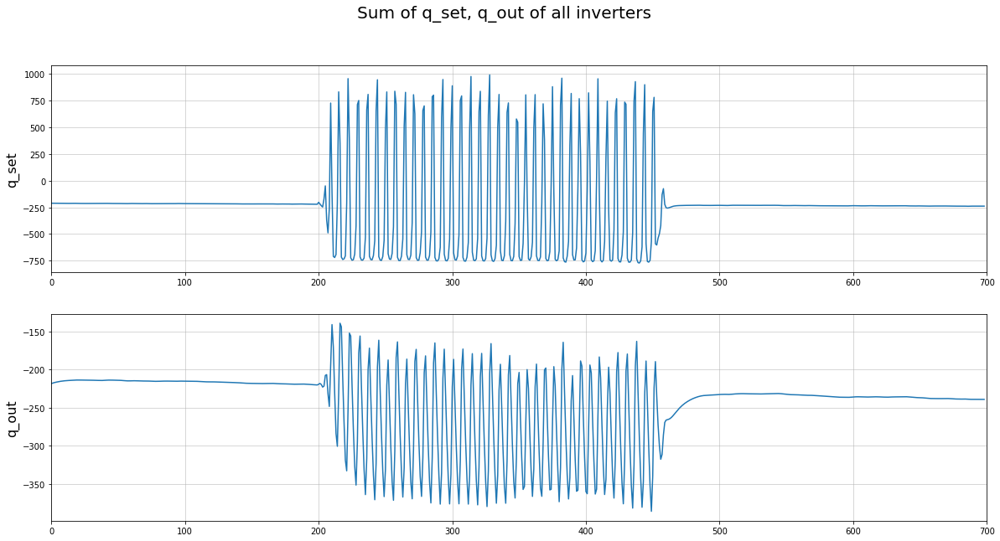

In [18]:
import numpy as np
def get_translation_and_slope(a_val):
    points = np.array(a_val)
    slope = points[:, 1] - points[:, 0]
    og_point = points[0, 2]
    translation = points[:, 2]
    return translation, slope

import matplotlib.pyplot as plt 
f, ax = plt.subplots(nrows=2, ncols=1, figsize=(20, 10))



q_set = 0
q_out = 0
for node_id in Logger.log_dict.keys():
    if 'load_' in node_id and 'inverter_' not in node_id:
        q_set += np.array(Logger.log_dict['adversary_inverter_' + node_id]['q_set']) + np.array(Logger.log_dict['inverter_' + node_id]['q_set'])
        q_out += np.array(Logger.log_dict['adversary_inverter_' + node_id]['q_out']) + np.array(Logger.log_dict['inverter_' + node_id]['q_out'])

f.suptitle('Sum of q_set, q_out of all inverters', fontsize=20)
#f.suptitle('Voltage oscillations at all nodes, load scaling factor: {}, solar factor: {}'.format(2, 3), fontsize=20)

ax[0].grid(linestyle='-', linewidth=0.5)
ax[0].set_xlim([0, 700])
ax[0].set_ylabel('q_set', fontsize=16)
translation = q_set
ax[0].plot(translation)

ax[1].grid(linestyle='-', linewidth=0.5)
ax[1].set_xlim([0, 700])
ax[1].set_ylabel('q_out', fontsize=16)
translation = q_out
ax[1].plot(translation)

plt.show()

# TEST AGENT

In [1]:
import time
from ray.tune.registry import register_env
from pycigar.utils.registry import make_create_env
from pycigar.utils.input_parser import input_parser
import numpy as np
import tensorflow as tf
import pickle
import matplotlib.pyplot as plt
from pycigar.utils.logging import logger
import os
import pycigar
import numpy as np
import json
from pathlib import Path
from ray.rllib.models.tf.tf_action_dist import DiagGaussian
from ray.rllib.models.catalog import ModelCatalog
from tqdm import tqdm

PATH = os.getcwd()

file_name = '/home/toanngo/new_baseline_240/main/run_train/run_train_0_lr=0.001_2020-10-15_20-39-57vn5bkg63/latest/policy_1000'

policy = os.path.join(PATH, file_name) 
start = 100
percentage_hack = 0.45

"""
Load the scenarios configuration file. This file contains the scenario information
for the experiment.
"""
misc_inputs_path = pycigar.DATA_DIR + "/ieee37busdata/misc_inputs.csv"
dss_path = pycigar.DATA_DIR + "/ieee37busdata/ieee37.dss"
load_solar_path = pycigar.DATA_DIR + "/ieee37busdata/load_solar_data.csv"
breakpoints_path = pycigar.DATA_DIR + "/ieee37busdata/breakpoints.csv"

sim_params = input_parser(misc_inputs_path, dss_path, load_solar_path, breakpoints_path, benchmark=True, percentage_hack=percentage_hack)
sim_params['env_config']['sims_per_step'] = 30
#sim_params['scenario_config']['custom_configs']['slack_bus_voltage'] = 1.06
#sim_params['scenario_config']['custom_configs']['load_scaling_factor'] = 1.5
#sim_params['scenario_config']['custom_configs']['solar_scaling_factor'] = 3

pycigar_params = {"exp_tag": "cooperative_multiagent_ppo",
                    "env_name": "MultiAttackCentralControlPhaseSpecificPVInverterEnv",
                    "simulator": "opendss"}

create_env, env_name = make_create_env(pycigar_params, version=0)
register_env(env_name, create_env)
sim_params['scenario_config']['start_end_time'] = [start, start + 750]
del sim_params['attack_randomization']
test_env = create_env(sim_params)
action_dist, _ = ModelCatalog.get_action_dist(test_env.action_space, config={}, dist_type=None, framework='tf')
test_env.observation_space  # get the observation space, we need this to construct our agent(s) observation input
test_env.action_space  # get the action space, we need this to construct our agent(s) action output
tf.compat.v1.enable_eager_execution()
policy = tf.saved_model.load(policy)
infer = policy.signatures['serving_default']
done = False
obs = test_env.reset()
obs = obs.tolist()

count = 0
while not done:
    out = infer(
        prev_reward=tf.constant([0.], tf.float32),
        observations=tf.constant([obs], tf.float32),
        is_training=tf.constant(False),
        seq_lens=tf.constant([0], tf.int32),
        prev_action=tf.constant([0], tf.int64)
    )['action_dist_inputs'].numpy()
    dist = action_dist(inputs=out, model=None)
    #act = dist.deterministic_sample().numpy().batches
    act = np.array(dist.deterministic_sample()).flatten()

    obs, r, done, _ = test_env.step(act)
    obs = obs.tolist()
    count += 1
"""while not done:
    obs, r, done, _ = test_env.step(np.array([10, 10, 10]))
    obs = obs.tolist()"""

log_dict = logger().log_dict
custom_metrics = logger().custom_metrics

ahihi


In [2]:
ACTION_RANGE = 0.1

def plot_new(log_dict, custom_metrics, epoch=''):
    def get_translation_and_slope(a_val, init_a):
        points = np.array(a_val)
        slope = points[:, 1] - points[:, 0]
        translation = points[:, 2] - init_a[2]
        return translation, slope

    plt.rc('font', size=15)
    plt.rc('figure', titlesize=35)
    inv_ks = [k for k in log_dict if k.startswith('inverter_s701')] #or k.startswith('inverter_s728')]
    regs = [k for k in log_dict if 'reg' in k]
    reg = regs[0] if regs else None

    f, ax = plt.subplots(
        3 + len(inv_ks) + (reg is not None), 2, figsize=(25, 8 + 4 * len(inv_ks) + 4 * (reg is not None))
    )
    #title = '[epoch {}][time {}][hack {}] total reward: {:.2f} || total unbalance: {:.4f}'.format(
    #    epoch, custom_metrics['start_time'], custom_metrics['hack'], sum(log_dict[inv_ks[0]]['reward']), sum(log_dict['u_metrics']['u_worst'])
    #)
    title = '[epoch {}][time {}][hack {}] total reward: {:.2f} || total unbalance: {:.4f}'.format(0, custom_metrics['start_time'], custom_metrics['hack'], 0, sum(log_dict['u_metrics']['u_worst']))
    f.suptitle(title)
    for i, k in enumerate(inv_ks):
        ax[0, 0].plot(log_dict[log_dict[k]['node']]['voltage'], label='voltage ({})'.format(k))

    inv_a = [k for k in log_dict if k.endswith('a') and k.startswith('inverter_')]
    inv_b = [k for k in log_dict if k.endswith('b') and k.startswith('inverter_')]
    inv_c = [k for k in log_dict if k.endswith('c') and k.startswith('inverter_')]

    for i, k in enumerate(inv_a):
        translation, slope = get_translation_and_slope(
            log_dict[k]['control_setting'], custom_metrics['init_control_settings'][k]
        )
        ax[2, 0].plot(translation)
        #ax[2, 0].plot(slope, label='RL slope (a2-a1) ({})'.format(k))

    for i, k in enumerate(inv_b):
        translation, slope = get_translation_and_slope(
            log_dict[k]['control_setting'], custom_metrics['init_control_settings'][k]
        )
        ax[3, 0].plot(translation)
        #ax[3, 0].plot(slope, label='RL slope (a2-a1) ({})'.format(k))

    for i, k in enumerate(inv_c):
        translation, slope = get_translation_and_slope(
            log_dict[k]['control_setting'], custom_metrics['init_control_settings'][k]
        )
        ax[4, 0].plot(translation)
        #ax[4, 0].plot(slope, label='RL slope (a2-a1) ({})'.format(k))

    ax[1, 0].plot(log_dict['u_metrics']['u_worst'], label='unbalance observer')
    ax[1, 0].plot(log_dict['u_metrics']['u_mean'], label='unbalance mean')
    ax[1, 0].fill_between(np.array(log_dict['u_metrics']['u_mean'])+np.array(log_dict['u_metrics']['u_std']), np.array(log_dict['u_metrics']['u_mean'])-np.array(log_dict['u_metrics']['u_std']), facecolor='orange', alpha=0.5)
    if reg:
        ax[-1, 0].plot(log_dict[reg]['tap_number'], label=reg)

    ax[0, 0].set_ylim([0.90, 1.10])
    ax[1, 0].set_ylim([0, 0.1])
    ax[2, 0].set_ylim([-280, 280])
    for i in range(len(inv_ks)):
        ax[2 + i, 0].set_ylim([-ACTION_RANGE * 1.1, ACTION_RANGE * 1.1])

    node_714 = [[], [], []]
    node_722 = [[], [], []]
    node_742 = [[], [], []]
    for i in log_dict['v_metrics'].keys():
        node_714[0].append(log_dict['v_metrics'][i][0]['714'][0])
        node_714[1].append(log_dict['v_metrics'][i][0]['714'][1])
        node_714[2].append(log_dict['v_metrics'][i][0]['714'][2])

        node_722[0].append(log_dict['v_metrics'][i][0]['722'][0])
        node_722[1].append(log_dict['v_metrics'][i][0]['722'][1])
        node_722[2].append(log_dict['v_metrics'][i][0]['722'][2])
    
        node_742[0].append(log_dict['v_metrics'][i][0]['742'][0])
        node_742[1].append(log_dict['v_metrics'][i][0]['742'][1])
        node_742[2].append(log_dict['v_metrics'][i][0]['742'][2])

    ax[0, 1].plot(node_714[0], label='voltage 714a')
    ax[0, 1].plot(node_714[1], label='voltage 714b')
    ax[0, 1].plot(node_714[2], label='voltage 714c')
    
    ax[1, 1].plot(node_722[0], label='voltage 722a')
    ax[1, 1].plot(node_722[1], label='voltage 722b')
    ax[1, 1].plot(node_722[2], label='voltage 722c')

    ax[2, 1].plot(node_742[0], label='voltage 742a')
    ax[2, 1].plot(node_742[1], label='voltage 742b')
    ax[2, 1].plot(node_742[2], label='voltage 742c')
    
    ax[0, 1].set_ylim([0.90, 1.10])
    ax[1, 1].set_ylim([0.90, 1.10])
    ax[2, 1].set_ylim([0.90, 1.10])

    ax[3, 1].plot(np.array(log_dict['inverter_s701a']['q_out']), label='q_out_s701a')
    #ax[2, 1].plot(np.array(log_dict['inverter_s701a']['sbar_solarirr'])*np.sign(log_dict['inverter_s701a']['q_out'])/(1.5e-3), label='q_avail_s701a')
    ax[3, 1].plot(np.array(log_dict['inverter_s701a']['q_avail_real']), label='q_avail_s701a')
    ax[3, 1].plot(np.array(log_dict['inverter_s701a']['q_set']), label='q_set_s701a')

    ax[4, 1].plot(np.array(log_dict['inverter_s701b']['q_out']), label='q_out_s701b')
    #ax[3, 1].plot(np.array(log_dict['inverter_s701b']['sbar_solarirr'])*np.sign(log_dict['inverter_s701b']['q_out'])/(1.5e-3), label='q_avail_s701b')
    ax[4, 1].plot(np.array(log_dict['inverter_s701b']['q_avail_real']), label='q_avail_s701b')
    ax[4, 1].plot(np.array(log_dict['inverter_s701b']['q_set']), label='q_set_s701b')

    ax[5, 1].plot(np.array(log_dict['inverter_s701c']['q_out']), label='q_out_s701c')
    #ax[4, 1].plot(np.array(log_dict['inverter_s701c']['sbar_solarirr'])*np.sign(log_dict['inverter_s701c']['q_out'])/(1.5e-3), label='q_avail_s701c')
    ax[5, 1].plot(np.array(log_dict['inverter_s701c']['q_avail_real']), label='q_avail_s701c')
    ax[5, 1].plot(np.array(log_dict['inverter_s701c']['q_set']), label='q_set_s701c')


    for row in ax:
        for a in row:
            a.grid(b=True, which='both')
            a.legend(loc=1, ncol=2)
    ax[4,0].legend(loc=3, ncol=2)
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    return f

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


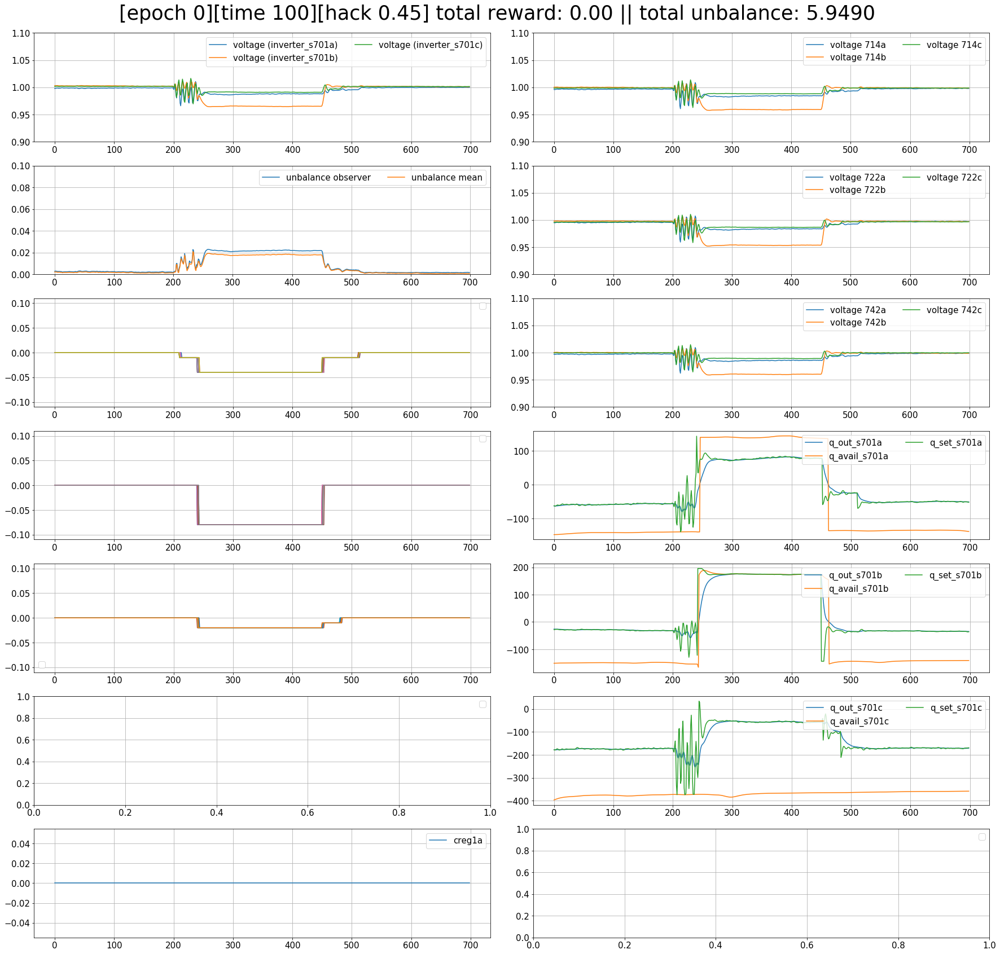

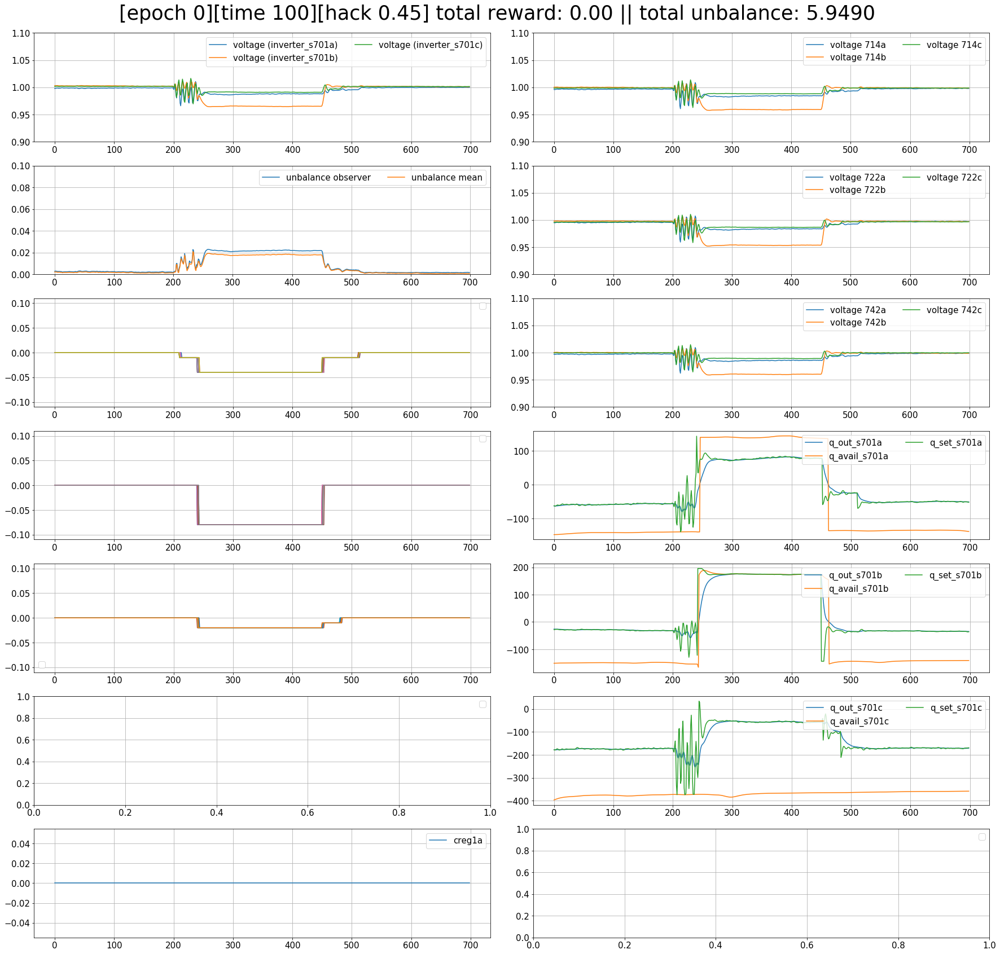

In [3]:
plot_new(log_dict, custom_metrics)

In [4]:
import pickle

with open('current_oscillation_defense.pickle', 'wb') as handle:
    pickle.dump(log_dict['current'], handle, protocol=pickle.HIGHEST_PROTOCOL)